In [2]:
pip install nltk


  Using cached nltk-3.9.1-py3-none-any.whl.metadata (2.9 kB)
Using cached nltk-3.9.1-py3-none-any.whl (1.5 MB)

   ---------------------------------------- 0/2 [regex]
   ---------------------------------------- 0/2 [regex]
   -------------------- ------------------- 1/2 [nltk]
   -------------------- ------------------- 1/2 [nltk]
   -------------------- ------------------- 1/2 [nltk]
   -------------------- ------------------- 1/2 [nltk]
   -------------------- ------------------- 1/2 [nltk]
   -------------------- ------------------- 1/2 [nltk]
   -------------------- ------------------- 1/2 [nltk]
   -------------------- ------------------- 1/2 [nltk]
   -------------------- ------------------- 1/2 [nltk]
   -------------------- ------------------- 1/2 [nltk]
   -------------------- ------------------- 1/2 [nltk]
   -------------------- ------------------- 1/2 [nltk]
   -------------------- ------------------- 1/2 [nltk]
   -------------------- ------------------- 1/2 [nltk]
   ---

In [3]:
# Import necessary libraries
import pandas as pd               # For data manipulation
import numpy as np                # For numerical operations
from sklearn.model_selection import train_test_split  # For splitting data
from sklearn.feature_extraction.text import TfidfVectorizer  # For converting text to numeric features
from sklearn.naive_bayes import MultinomialNB  # For the classifier (Naive Bayes)
from sklearn.metrics import accuracy_score, classification_report  # For evaluation
import nltk  # For natural language processing
nltk.download('stopwords')  # Download the stopwords
from nltk.corpus import stopwords  # To remove common words that don't contribute to the meaning


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


In [4]:
import pandas as pd

# Load the dataset
file_path = 'Combined_Dataset.csv'  # Replace with your file path
df = pd.read_csv(file_path)

# Display basic information
print(df.info())
print(df.head())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4055 entries, 0 to 4054
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Text      4055 non-null   object
 1   Category  4055 non-null   object
dtypes: object(2)
memory usage: 63.5+ KB
None
                                                Text            Category
0                            Waa maxat tinoolajiyad?  Technology general
1  Eregya tiknooloji markiisa hore halkoo kasoo j...  Technology general
2        Maxaa loola jeedaa ereyada Tikno iyo Looji?  Technology general
3           Nolosha sidee ahayd tiknolajiyada kahor?  Technology general
4   Tiknoolajiyada mexee kusoo kordhisay nolosheena?  Technology general


In [5]:
# Get the dimensions of the dataset
dimensions = df.shape

# Display the dimensions
print(f"The dataset has {dimensions[0]} rows and {dimensions[1]} columns.")


The dataset has 4055 rows and 2 columns.


In [6]:
# Get unique values in the 'Category' column
unique_categories = df['Category'].unique()

# Display the unique categories
print("Unique categories in the 'Category' column:", unique_categories)


Unique categories in the 'Category' column: ['Technology general' 'Baraha bulshada' 'internet-ka soomaaliya'
 'Qalabyada tiknoolojiyadeed ee l' 'Xalinta dhibaatooyinka calamiga'
 'deep fake' 'BLOCKCHAIN IYO LACAGAHA DEJITAL' 'cagliga macmalka'
 'technologyada markabaka' 'LMS( NIDAAMKA MARAYNTA WAXBARAS'
 'Medical Technology' 'VR waxbarasho' 'Decentralized Finance'
 'Isbeddelka tiknoolojiyada sanad' 'Tiknoolojiyada loogu talagalay '
 'Tiknolojida Qorsheynta gaadiidk' 'Robot-yada beeraha' 'Chat About Tech'
 'technology-yada amaanka wadooyi' 'Wada sheqesiga codka iyo muuqaa'
 'Tiknoolojiyada ilaalinta cyber-' 'Tiknolojiyada wayarleska'
 'Saameeynta tiknolajiyada ee deg' 'Tiknoolojiyada tamarta nadiifka'
 'Basic Tech Question' 'TiknolojiyadaXiriiirka bulshada'
 'Technology yada Suuq geynta cas' 'Tiknoolojiyada qorsheynta gaadi'
 'cryptography']


In [7]:
# Check for missing data in the dataset
missing_data = df.isnull().sum()

# Display the number of missing values in each column
print(missing_data)


Text        0
Category    0
dtype: int64


In [8]:
# Drop rows with missing data
df_cleaned = df.dropna()

# Verify if the missing data is handled
print(df_cleaned.isnull().sum())


Text        0
Category    0
dtype: int64


In [9]:
df['Category'] = df['Category'].fillna('Unknown')


In [10]:
mode_value = df['Category'].mode()[0]
df['Category'] = df['Category'].fillna(mode_value)


In [11]:
# Replace missing values in 'Text' with an empty string or a placeholder
df['Text'] = df['Text'].fillna('')  # Or df['Text'] = df['Text'].fillna('Missing Text')

In [12]:
# Verify missing data after handling
print(df.isnull().sum())


Text        0
Category    0
dtype: int64


In [13]:
# Check for duplicate rows
duplicates = df.duplicated()

# Count the total number of duplicate rows
num_duplicates = duplicates.sum()

print(f"Number of duplicate rows: {num_duplicates}")


Number of duplicate rows: 2916


In [14]:
# Display duplicate rows
duplicate_rows = df[df.duplicated()]
print("Duplicate rows:")
print(duplicate_rows)


Duplicate rows:
                                                   Text  \
251   Waa maxay tiknoolajiyada soo koraya ee ugu saa...   
252   Sidee quantum computing u beddeli kartaa musta...   
253   Maxay yihiin faa'iidooyinka iyo caqabadaha tik...   
254   Sidee loo isticmaali karaa tiknoolajiyada codk...   
255   Maxay yihiin isbeddellada tiknoolajiyada casri...   
...                                                 ...   
3614  Sidee AI u horumarin kartaa adeegyada dowliga ah?   
3615  Maxay yihiin codsiyada AI ee ku saabsan ilaali...   
3616            Sidee AI looga faa’iidaystay gaming-ka?   
3867                                   Waa maxay drone?   
3945  Maxay yihiin caqabadaha tiknoolojiyada qorshey...   

                             Category  
251   BLOCKCHAIN IYO LACAGAHA DEJITAL  
252   BLOCKCHAIN IYO LACAGAHA DEJITAL  
253   BLOCKCHAIN IYO LACAGAHA DEJITAL  
254   BLOCKCHAIN IYO LACAGAHA DEJITAL  
255   BLOCKCHAIN IYO LACAGAHA DEJITAL  
...                               .

In [15]:
# Check for duplicate rows based on the 'Text' column
duplicates = df[df.duplicated(subset=['Text'], keep=False)]

# Display duplicate rows for review
print("Duplicate rows based on 'Text':")
print(duplicates)


Duplicate rows based on 'Text':
                                                   Text  \
178                                            WEYDIIMO   
241   Waa maxay tiknoolajiyada soo koraya ee ugu saa...   
242   Sidee quantum computing u beddeli kartaa musta...   
243   Maxay yihiin faa'iidooyinka iyo caqabadaha tik...   
244   Sidee loo isticmaali karaa tiknoolajiyada codk...   
...                                                 ...   
3650                                           WEYDIIMO   
3829                                   Waa maxay drone?   
3867                                   Waa maxay drone?   
3915  Maxay yihiin caqabadaha tiknoolojiyada qorshey...   
3945  Maxay yihiin caqabadaha tiknoolojiyada qorshey...   

                             Category  
178   Xalinta dhibaatooyinka calamiga  
241   BLOCKCHAIN IYO LACAGAHA DEJITAL  
242   BLOCKCHAIN IYO LACAGAHA DEJITAL  
243   BLOCKCHAIN IYO LACAGAHA DEJITAL  
244   BLOCKCHAIN IYO LACAGAHA DEJITAL  
...                

In [16]:
# Remove duplicates based on 'Text' while keeping the first occurrence
df = df.drop_duplicates(subset=['Text'], keep='first')

# Verify the removal
print(f"Number of rows after removing duplicates: {df.shape[0]}")


Number of rows after removing duplicates: 1127


In [17]:
# Basic statistics of the dataset
print("Dataset Overview:")
print(df.describe(include='all'))  # Includes all columns

# Number of rows and columns
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")


Dataset Overview:
                           Text         Category
count                      1127             1127
unique                     1127               29
top     Waa maxat tinoolajiyad?  Baraha bulshada
freq                          1              100
Number of rows: 1127
Number of columns: 2


Category Distribution:
Category
Baraha bulshada                    100
cryptography                        99
Basic Tech Question                 97
cagliga macmalka                    91
Isbeddelka tiknoolojiyada sanad     78
Chat About Tech                     66
Tiknoolojiyada ilaalinta cyber-     50
Saameeynta tiknolajiyada ee deg     50
Tiknoolojiyada qorsheynta gaadi     46
Decentralized Finance               41
Medical Technology                  36
internet-ka soomaaliya              35
Xalinta dhibaatooyinka calamiga     31
BLOCKCHAIN IYO LACAGAHA DEJITAL     30
Tiknolojida Qorsheynta gaadiidk     30
VR waxbarasho                       29
LMS( NIDAAMKA MARAYNTA WAXBARAS     25
Qalabyada tiknoolojiyadeed ee l     22
Technology general                  21
Wada sheqesiga codka iyo muuqaa     20
TiknolojiyadaXiriiirka bulshada     20
Tiknoolojiyada loogu talagalay      20
Tiknoolojiyada tamarta nadiifka     19
Robot-yada beeraha                  18
technology-yada amaanka wadooyi 

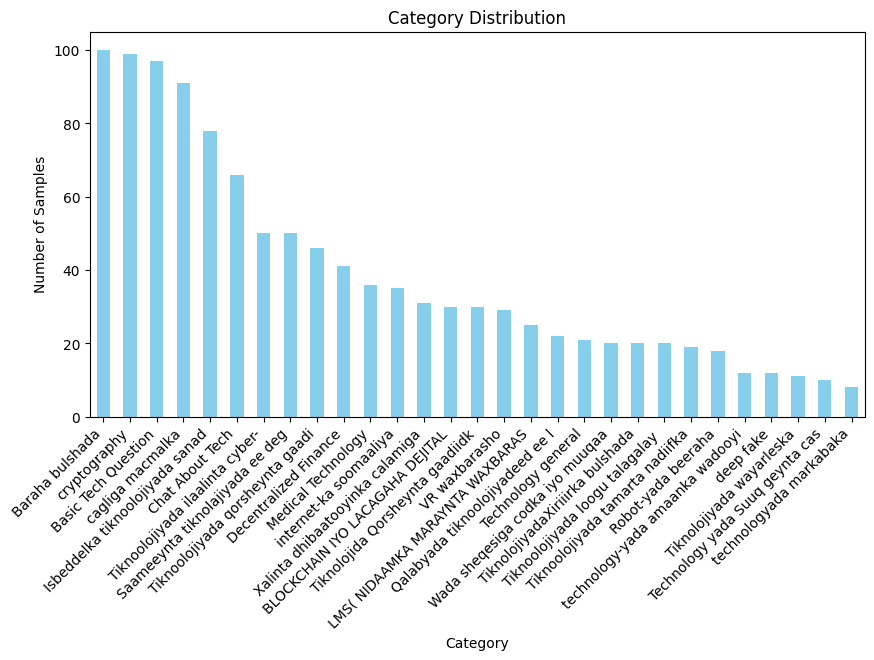

In [18]:
# Category distribution
category_counts = df['Category'].value_counts()

print("Category Distribution:")
print(category_counts)

# Visualize the distribution
import matplotlib.pyplot as plt

category_counts.plot(kind='bar', figsize=(10, 5), color='skyblue')
plt.title('Category Distribution')
plt.xlabel('Category')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45, ha='right')
plt.show()


Text Length Statistics:
count    1127.000000
mean       61.483585
std        32.555042
min         8.000000
25%        43.000000
50%        59.000000
75%        74.000000
max       382.000000
Name: Text_Length, dtype: float64


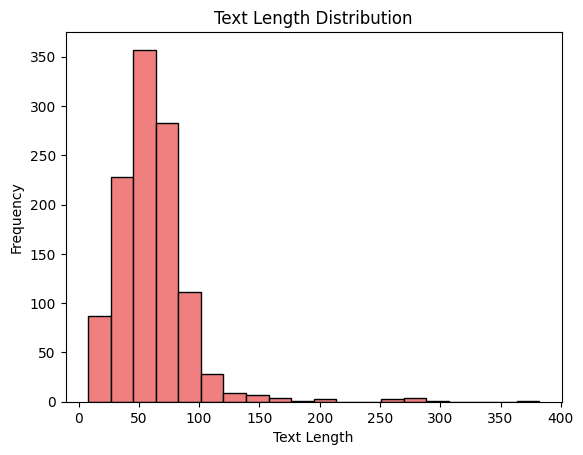

In [19]:
# Add a column for text length
df['Text_Length'] = df['Text'].apply(len)

# Summary of text length
print("Text Length Statistics:")
print(df['Text_Length'].describe())

# Visualize the text length distribution
plt.hist(df['Text_Length'], bins=20, color='lightcoral', edgecolor='black')
plt.title('Text Length Distribution')
plt.xlabel('Text Length')
plt.ylabel('Frequency')
plt.show()


Most Common Words:
[('maxay', 427), ('sidee', 237), ('u', 223), ('ee', 216), ('ai', 122), ('yihiin', 99), ('tahay', 86), ('la', 85), ('tiknoolajiyada', 76), ('loo', 74), ('karaa', 65), ('gaadiidka', 64), ('tiknoolojiyada', 63), ('caafimaadka', 62), ('kartaa', 56), ('badan', 50), ('maxaa', 49), ('wax', 47), ('soomaaliya', 47), ('deegaanka', 44)]


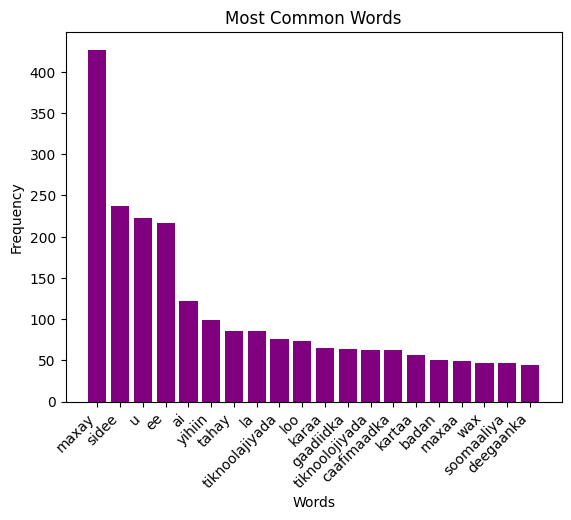

In [20]:
from collections import Counter
import string

# Combine all text into one string
all_text = ' '.join(df['Text'].str.lower().str.translate(str.maketrans('', '', string.punctuation)))
somali_stop_words = [
    'iyo', 'waxaa', 'ka', 'waa', 'ayaa', 'oo', 'in', 'ma', 'ah', 'xataa',
    'aad', 'albaabkii', 'atabo', 'ay', 'ayaa', 'ayee', 'ayuu', 'dhan', 'hadana',
    'in', 'inuu', 'isku', 'jiray', 'jirtay', 'kale', 'kasoo', 'ku', 'kuu',
    'lakin', 'markii', 'oo', 'si', 'soo', 'uga', 'ugu', 'uu', 'waa', 'waxa', 'waxuu'
]

# Tokenize and remove stop words
words = [word for word in all_text.split() if word not in somali_stop_words]

# Count word frequencies
word_counts = Counter(words)
common_words = word_counts.most_common(20)

# Display the most common words
print("Most Common Words:")
print(common_words)

# Visualize the common words
common_words_dict = dict(common_words)
plt.bar(common_words_dict.keys(), common_words_dict.values(), color='purple')
plt.title('Most Common Words')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.show()


Average Text Length per Category:
Category
BLOCKCHAIN IYO LACAGAHA DEJITAL     55.400000
Baraha bulshada                     45.590000
Basic Tech Question                 48.814433
Chat About Tech                     68.060606
Decentralized Finance              129.390244
Isbeddelka tiknoolojiyada sanad     58.615385
LMS( NIDAAMKA MARAYNTA WAXBARAS     42.960000
Medical Technology                  80.888889
Qalabyada tiknoolojiyadeed ee l     72.636364
Robot-yada beeraha                  58.833333
Saameeynta tiknolajiyada ee deg     63.080000
Technology general                  54.095238
Technology yada Suuq geynta cas     71.300000
Tiknolojida Qorsheynta gaadiidk     62.700000
Tiknolojiyada wayarleska            70.181818
TiknolojiyadaXiriiirka bulshada     73.700000
Tiknoolojiyada ilaalinta cyber-     39.180000
Tiknoolojiyada loogu talagalay      68.450000
Tiknoolojiyada qorsheynta gaadi     62.869565
Tiknoolojiyada tamarta nadiifka     59.368421
VR waxbarasho                       7

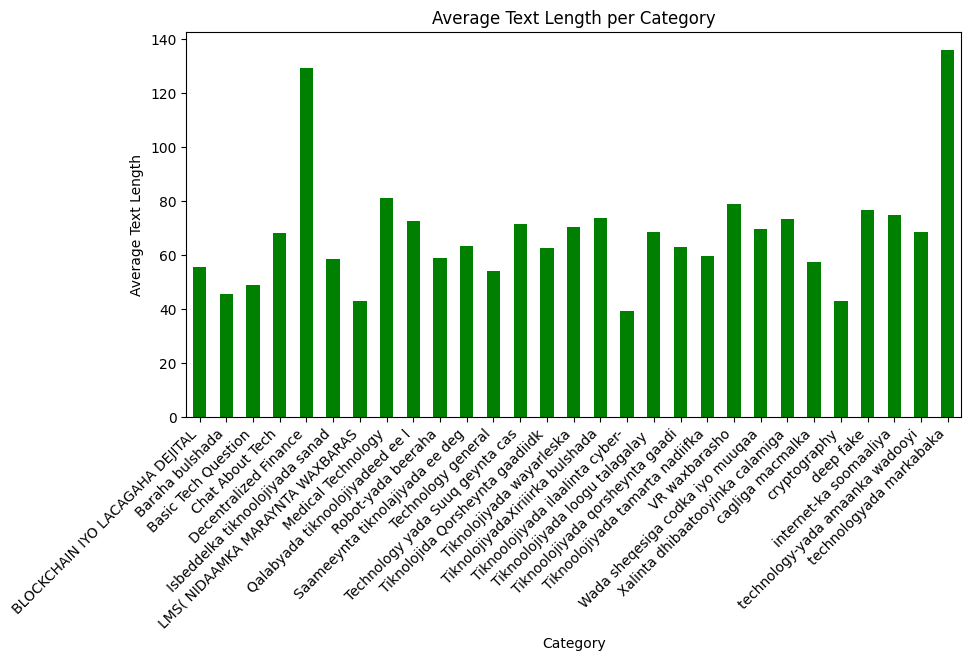

In [21]:
# Average text length per category
category_text_length = df.groupby('Category')['Text_Length'].mean()

print("Average Text Length per Category:")
print(category_text_length)

# Visualize
category_text_length.plot(kind='bar', figsize=(10, 5), color='green')
plt.title('Average Text Length per Category')
plt.xlabel('Category')
plt.ylabel('Average Text Length')
plt.xticks(rotation=45, ha='right')
plt.show()


In [23]:
pip install WordCloud

Note: you may need to restart the kernel to use updated packages.


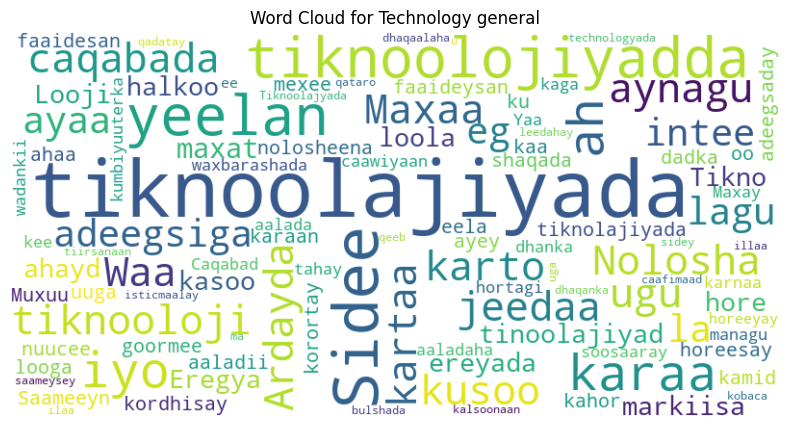

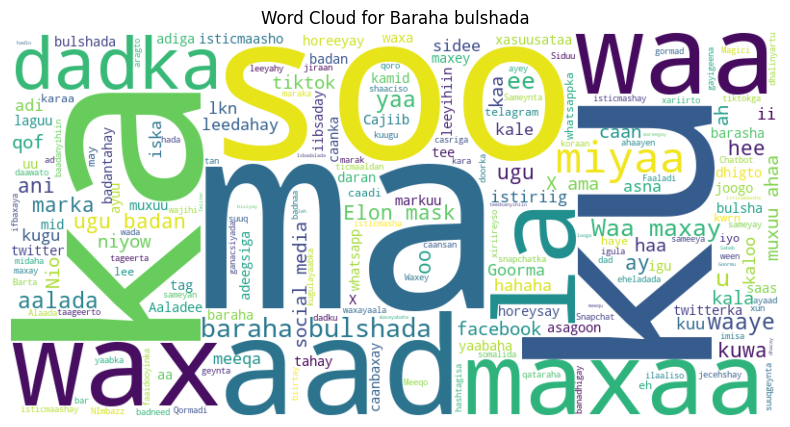

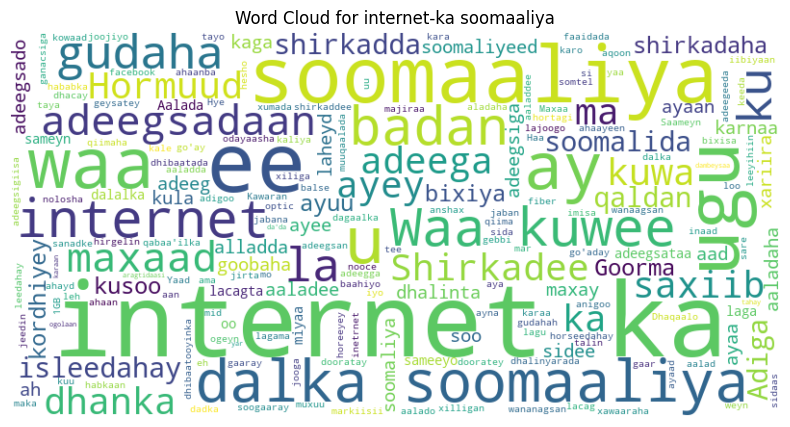

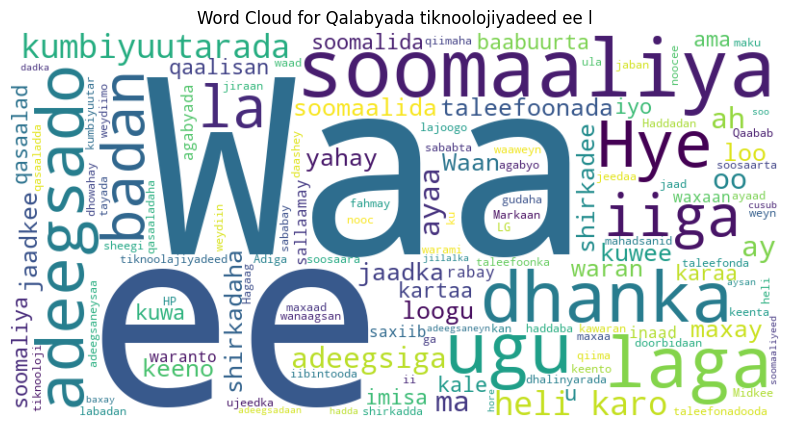

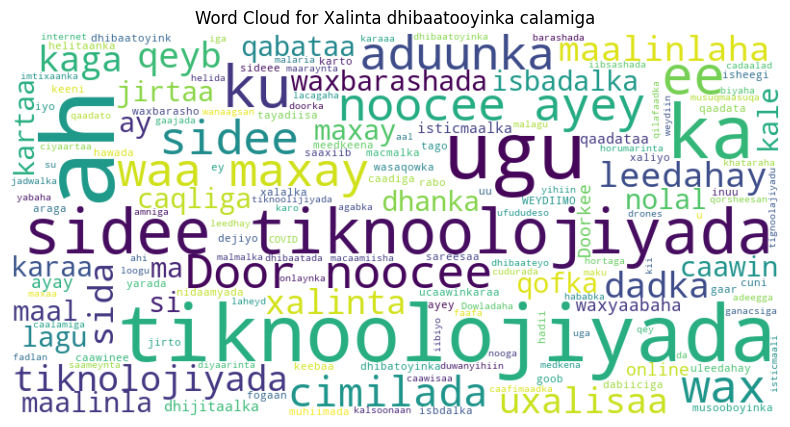

...

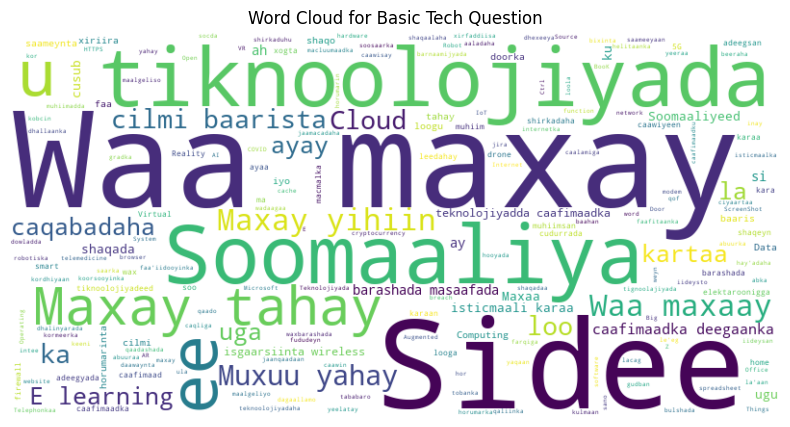

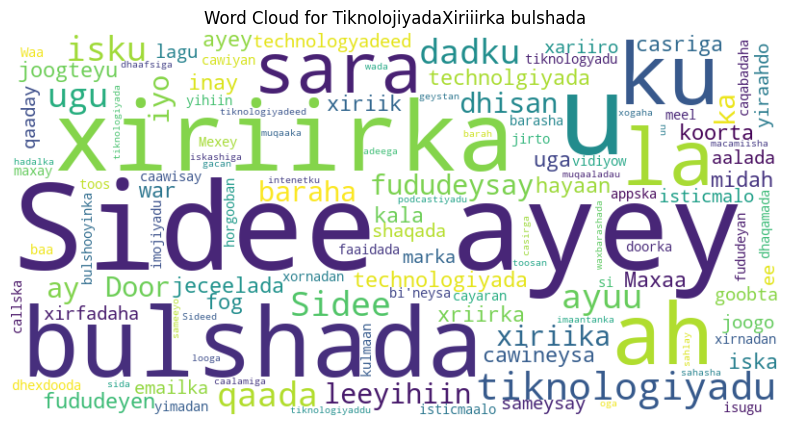

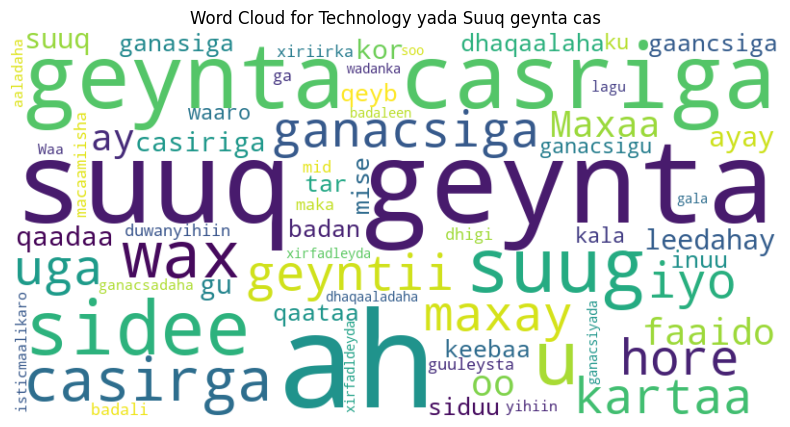

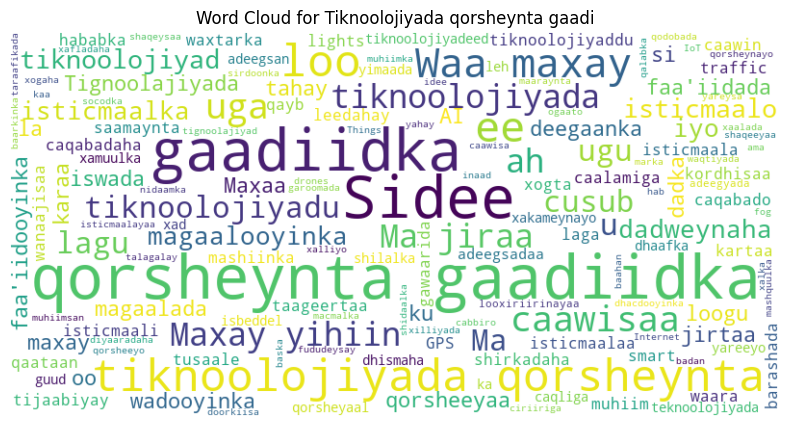

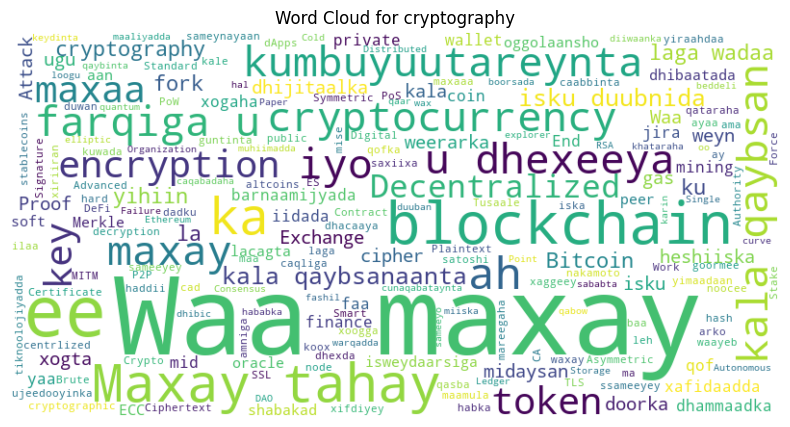

In [24]:
from wordcloud import WordCloud

# Generate word clouds for each category
for category in df['Category'].unique():
    category_text = ' '.join(df[df['Category'] == category]['Text'])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(category_text)

    # Display the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {category}')
    plt.axis('off')
    plt.show()


In [25]:
somali_stop_words = [
    'iyo', 'waxaa', 'ka', 'waa', 'ayaa', 'oo', 'in', 'ma', 'ah', 'xataa',
    'aad', 'albaabkii', 'atabo', 'ay', 'ayaa', 'ayee', 'ayuu', 'dhan', 'hadana',
    'in', 'inuu', 'isku', 'jiray', 'jirtay', 'kale', 'kasoo', 'ku', 'kuu',
    'lakin', 'markii', 'oo', 'si', 'soo', 'uga', 'ugu', 'uu', 'waa', 'waxa', 'waxuu'
]


In [26]:
import string

# Preprocess the 'Text' column by removing stop words
def remove_stop_words(text):
    words = text.lower().translate(str.maketrans('', '', string.punctuation)).split()
    filtered_words = [word for word in words if word not in somali_stop_words]
    return ' '.join(filtered_words)

# Apply the function to the 'Text' column
df['Processed_Text'] = df['Text'].apply(remove_stop_words)

# Display the first few rows to verify
print(df[['Text', 'Processed_Text']].head())


                                                Text  \
0                            Waa maxat tinoolajiyad?   
1  Eregya tiknooloji markiisa hore halkoo kasoo j...   
2        Maxaa loola jeedaa ereyada Tikno iyo Looji?   
3           Nolosha sidee ahayd tiknolajiyada kahor?   
4   Tiknoolajiyada mexee kusoo kordhisay nolosheena?   

                                    Processed_Text  
0                               maxat tinoolajiyad  
1    eregya tiknooloji markiisa hore halkoo jeedaa  
2           maxaa loola jeedaa ereyada tikno looji  
3          nolosha sidee ahayd tiknolajiyada kahor  
4  tiknoolajiyada mexee kusoo kordhisay nolosheena  


In [27]:
print("Before Stop Word Removal:")
print(df['Text'].iloc[0])  # Original text

print("\nAfter Stop Word Removal:")
print(df['Processed_Text'].iloc[0])  # Processed text


Before Stop Word Removal:
Waa maxat tinoolajiyad?

After Stop Word Removal:
maxat tinoolajiyad


In [28]:
# Tokenize using simple string split
df['Tokens'] = df['Processed_Text'].apply(lambda x: x.split())

# Display the tokens for the first few rows
print(df[['Processed_Text', 'Tokens']].head())


                                    Processed_Text  \
0                               maxat tinoolajiyad   
1    eregya tiknooloji markiisa hore halkoo jeedaa   
2           maxaa loola jeedaa ereyada tikno looji   
3          nolosha sidee ahayd tiknolajiyada kahor   
4  tiknoolajiyada mexee kusoo kordhisay nolosheena   

                                              Tokens  
0                              [maxat, tinoolajiyad]  
1  [eregya, tiknooloji, markiisa, hore, halkoo, j...  
2      [maxaa, loola, jeedaa, ereyada, tikno, looji]  
3      [nolosha, sidee, ahayd, tiknolajiyada, kahor]  
4  [tiknoolajiyada, mexee, kusoo, kordhisay, nolo...  


In [29]:
print("Original Text:")
print(df['Text'].iloc[0])

print("\nProcessed Text:")
print(df['Processed_Text'].iloc[0])

print("\nTokens:")
print(df['Tokens'].iloc[0])


Original Text:
Waa maxat tinoolajiyad?

Processed Text:
maxat tinoolajiyad

Tokens:
['maxat', 'tinoolajiyad']


In [30]:
from sklearn.model_selection import train_test_split

# Define features (X) and labels (y)
X = df['Processed_Text']  # Use the preprocessed text
y = df['Category']  # Use the category labels

# Split the data into training and testing sets (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Display the shapes of the resulting datasets
print(f"Training set size: {X_train.shape[0]} samples")
print(f"Testing set size: {X_test.shape[0]} samples")


Training set size: 901 samples
Testing set size: 226 samples


In [31]:
print("Training set category distribution:")
print(y_train.value_counts(normalize=True))

print("\nTesting set category distribution:")
print(y_test.value_counts(normalize=True))


Training set category distribution:
Category
Baraha bulshada                    0.088790
cryptography                       0.087680
Basic Tech Question                0.085461
cagliga macmalka                   0.081021
Isbeddelka tiknoolojiyada sanad    0.068812
Chat About Tech                    0.058824
Tiknoolojiyada ilaalinta cyber-    0.044395
Saameeynta tiknolajiyada ee deg    0.044395
Tiknoolojiyada qorsheynta gaadi    0.041065
Decentralized Finance              0.036626
Medical Technology                 0.032186
internet-ka soomaaliya             0.031077
Xalinta dhibaatooyinka calamiga    0.027747
Tiknolojida Qorsheynta gaadiidk    0.026637
BLOCKCHAIN IYO LACAGAHA DEJITAL    0.026637
VR waxbarasho                      0.025527
LMS( NIDAAMKA MARAYNTA WAXBARAS    0.022198
Technology general                 0.018868
Qalabyada tiknoolojiyadeed ee l    0.018868
Wada sheqesiga codka iyo muuqaa    0.017758
TiknolojiyadaXiriiirka bulshada    0.017758
Tiknoolojiyada loogu talagalay 

In [32]:
# Define the predictor (features) and target (labels)
X = df['Processed_Text']  # Text data for prediction
y = df['Category']  # Target labels


In [33]:
print("Predictor (X) examples:")
print(X.head())

print("\nTarget (y) examples:")
print(y.head())


Predictor (X) examples:
0                                 maxat tinoolajiyad
1      eregya tiknooloji markiisa hore halkoo jeedaa
2             maxaa loola jeedaa ereyada tikno looji
3            nolosha sidee ahayd tiknolajiyada kahor
4    tiknoolajiyada mexee kusoo kordhisay nolosheena
Name: Processed_Text, dtype: object

Target (y) examples:
0    Technology general
1    Technology general
2    Technology general
3    Technology general
4    Technology general
Name: Category, dtype: object


In [34]:
from sklearn.model_selection import train_test_split

# Split the data into train and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Verify the splits
print(f"Training predictors shape: {X_train.shape}")
print(f"Testing predictors shape: {X_test.shape}")
print(f"Training target shape: {y_train.shape}")
print(f"Testing target shape: {y_test.shape}")


Training predictors shape: (901,)
Testing predictors shape: (226,)
Training target shape: (901,)
Testing target shape: (226,)


In [35]:
from sklearn.preprocessing import LabelEncoder


In [36]:
# Initialize the label encoder
label_encoder = LabelEncoder()

# Fit the encoder on the training labels
y_train_encoded = label_encoder.fit_transform(y_train)

# Transform the test labels using the same encoder
y_test_encoded = label_encoder.transform(y_test)


In [37]:
# Display the first few encoded values
print("Encoded Training Labels (y_train):")
print(y_train_encoded[:10])

print("\nEncoded Testing Labels (y_test):")
print(y_test_encoded[:10])

# Check the mapping of categories to numerical values
print("\nCategory to Number Mapping:")
print(dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_))))


Encoded Training Labels (y_train):
[ 3  4  4  1  1  2 10  3 18  3]

Encoded Testing Labels (y_test):
[20  9 13 23 11 20  8  7 17  0]

Category to Number Mapping:
{'BLOCKCHAIN IYO LACAGAHA DEJITAL': 0, 'Baraha bulshada': 1, 'Basic Tech Question': 2, 'Chat About Tech': 3, 'Decentralized Finance': 4, 'Isbeddelka tiknoolojiyada sanad': 5, 'LMS( NIDAAMKA MARAYNTA WAXBARAS': 6, 'Medical Technology': 7, 'Qalabyada tiknoolojiyadeed ee l': 8, 'Robot-yada beeraha': 9, 'Saameeynta tiknolajiyada ee deg': 10, 'Technology general': 11, 'Technology yada Suuq geynta cas': 12, 'Tiknolojida Qorsheynta gaadiidk': 13, 'Tiknolojiyada wayarleska': 14, 'TiknolojiyadaXiriiirka bulshada': 15, 'Tiknoolojiyada ilaalinta cyber-': 16, 'Tiknoolojiyada loogu talagalay ': 17, 'Tiknoolojiyada qorsheynta gaadi': 18, 'Tiknoolojiyada tamarta nadiifka': 19, 'VR waxbarasho': 20, 'Wada sheqesiga codka iyo muuqaa': 21, 'Xalinta dhibaatooyinka calamiga': 22, 'cagliga macmalka': 23, 'cryptography': 24, 'deep fake': 25, 'intern

In [38]:
# Decode numerical labels back to original categories
decoded_labels = label_encoder.inverse_transform(y_train_encoded[:10])
print("\nDecoded Labels:")
print(decoded_labels)



Decoded Labels:
['Chat About Tech' 'Decentralized Finance' 'Decentralized Finance'
 'Baraha bulshada' 'Baraha bulshada' 'Basic Tech Question'
 'Saameeynta tiknolajiyada ee deg' 'Chat About Tech'
 'Tiknoolojiyada qorsheynta gaadi' 'Chat About Tech']


In [39]:
from sklearn.feature_extraction.text import TfidfVectorizer


In [40]:
# Initialize the TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(
    max_features=5000,  # Limit the number of features (optional)
    stop_words=somali_stop_words,  # Use custom Somali stop words
    ngram_range=(1, 2)  # Include unigrams and bigrams
)


In [41]:
# Fit the vectorizer on training data and transform it
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)

# Transform the test data using the same vectorizer
X_test_tfidf = tfidf_vectorizer.transform(X_test)


In [42]:
print("Shape of TF-IDF Training Data:", X_train_tfidf.shape)
print("Shape of TF-IDF Testing Data:", X_test_tfidf.shape)

# Display feature names (optional, useful for debugging or exploration)
print("\nSample Feature Names:", tfidf_vectorizer.get_feature_names_out()[:10])


Shape of TF-IDF Training Data: (901, 5000)
Shape of TF-IDF Testing Data: (226, 5000)

Sample Feature Names: ['10' '10 maxay' '10 mexey' '11' '11 majiraa' '11 maxay' '11 sidee' '12'
 '12 isheegi' '12 sidee']


In [43]:
# Convert sparse matrix to dense for visualization (optional, not recommended for large datasets)
import pandas as pd

tfidf_df = pd.DataFrame(
    X_train_tfidf[:10].toarray(),  # Take a small subset
    columns=tfidf_vectorizer.get_feature_names_out()
)

print("\nSample TF-IDF Matrix:")
print(tfidf_df.head())



Sample TF-IDF Matrix:
    10  10 maxay  10 mexey   11  11 majiraa  11 maxay  11 sidee   12  \
0  0.0       0.0       0.0  0.0         0.0       0.0       0.0  0.0   
1  0.0       0.0       0.0  0.0         0.0       0.0       0.0  0.0   
2  0.0       0.0       0.0  0.0         0.0       0.0       0.0  0.0   
3  0.0       0.0       0.0  0.0         0.0       0.0       0.0  0.0   
4  0.0       0.0       0.0  0.0         0.0       0.0       0.0  0.0   

   12 isheegi  12 sidee  ...  yihiin xogaha  yimaada  yimaada gaadiidka  \
0         0.0       0.0  ...            0.0      0.0                0.0   
1         0.0       0.0  ...            0.0      0.0                0.0   
2         0.0       0.0  ...            0.0      0.0                0.0   
3         0.0       0.0  ...            0.0      0.0                0.0   
4         0.0       0.0  ...            0.0      0.0                0.0   

   yimadan  yimadan toos  yimid  yimid elon  yiraahdaa  yiraahdaa bitcoin  \
0      0.0      

In [44]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report

# Initialize the Naive Bayes classifier
nb_classifier = MultinomialNB()

# Train the classifier on the training data
nb_classifier.fit(X_train_tfidf, y_train_encoded)

# Make predictions on the test data
y_pred_nb = nb_classifier.predict(X_test_tfidf)

# Evaluate the model
print("Naive Bayes Classifier Results:")
print("Accuracy:", accuracy_score(y_test_encoded, y_pred_nb))
print("\nClassification Report:\n", classification_report(y_test_encoded, y_pred_nb))


Naive Bayes Classifier Results:
Accuracy: 0.4557522123893805

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.53      0.95      0.68        20
           2       0.36      0.75      0.48        20
           3       0.29      0.15      0.20        13
           4       0.50      0.25      0.33         8
           5       0.39      0.56      0.46        16
           6       0.00      0.00      0.00         5
           7       0.00      0.00      0.00         7
           8       0.00      0.00      0.00         5
           9       1.00      0.50      0.67         4
          10       1.00      0.30      0.46        10
          11       0.00      0.00      0.00         4
          12       0.00      0.00      0.00         2
          13       0.67      0.33      0.44         6
          14       0.00      0.00      0.00         2
          15       0.00      0.00      0.00      

C:\Users\hp\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hp\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hp\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, m

In [45]:
from sklearn.svm import LinearSVC

# Initialize the SVM classifier
svm_classifier = LinearSVC(random_state=42)

# Train the classifier on the training data
svm_classifier.fit(X_train_tfidf, y_train_encoded)

# Make predictions on the test data
y_pred_svm = svm_classifier.predict(X_test_tfidf)

# Evaluate the model
print("\nSupport Vector Machine (SVM) Classifier Results:")
print("Accuracy:", accuracy_score(y_test_encoded, y_pred_svm))
print("\nClassification Report:\n", classification_report(y_test_encoded, y_pred_svm))



Support Vector Machine (SVM) Classifier Results:
Accuracy: 0.7477876106194691

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.33      0.50         6
           1       0.82      0.90      0.86        20
           2       0.82      0.70      0.76        20
           3       0.50      0.31      0.38        13
           4       0.55      0.75      0.63         8
           5       0.77      0.62      0.69        16
           6       1.00      1.00      1.00         5
           7       0.60      0.43      0.50         7
           8       0.67      0.40      0.50         5
           9       0.80      1.00      0.89         4
          10       0.91      1.00      0.95        10
          11       0.67      0.50      0.57         4
          12       1.00      1.00      1.00         2
          13       0.67      0.67      0.67         6
          14       1.00      1.00      1.00         2
          15       0.67      0.

In [46]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay

# Calculate accuracy
accuracy = accuracy_score(y_test_encoded, y_pred_svm)
print("Accuracy:", accuracy)

# Calculate precision, recall, and F1-score for each class
precision = precision_score(y_test_encoded, y_pred_svm, average='weighted')
recall = recall_score(y_test_encoded, y_pred_svm, average='weighted')
f1 = f1_score(y_test_encoded, y_pred_svm, average='weighted')

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")


Accuracy: 0.7477876106194691
Precision: 0.7598214024970922
Recall: 0.7477876106194691
F1-Score: 0.7343093470547988


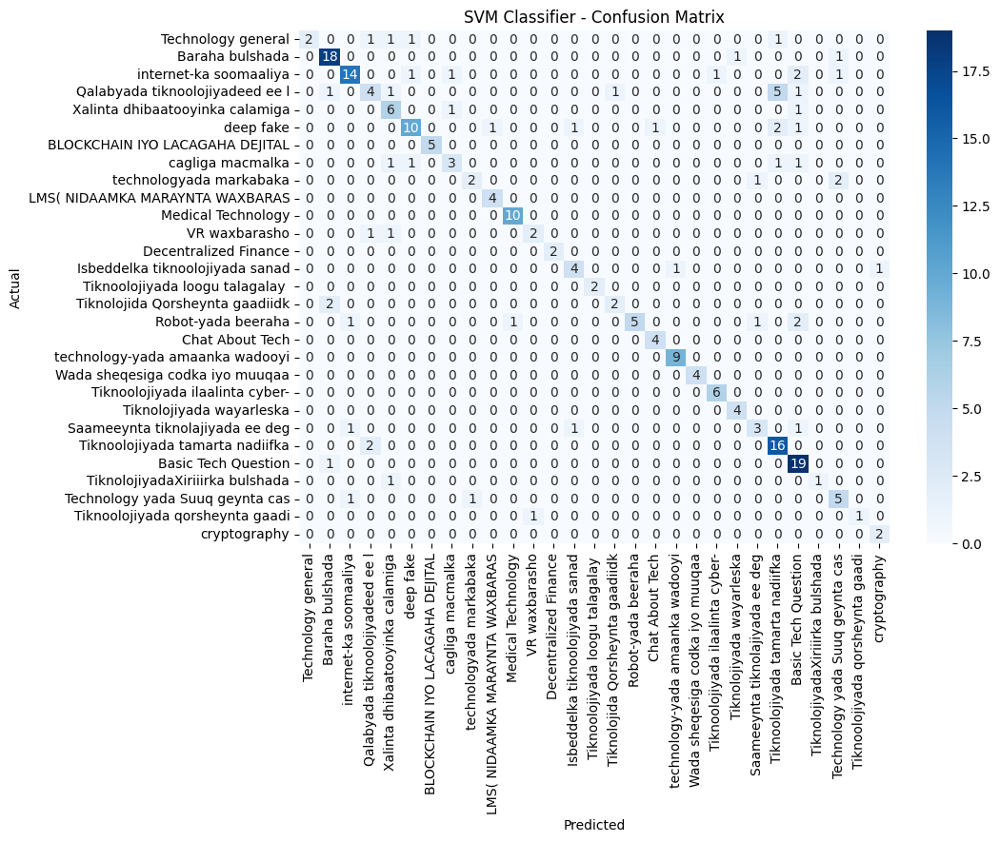

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute confusion matrix
cm = confusion_matrix(y_test_encoded, y_pred_svm)

# Display confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=df['Category'].unique(), yticklabels=df['Category'].unique())
plt.title("SVM Classifier - Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


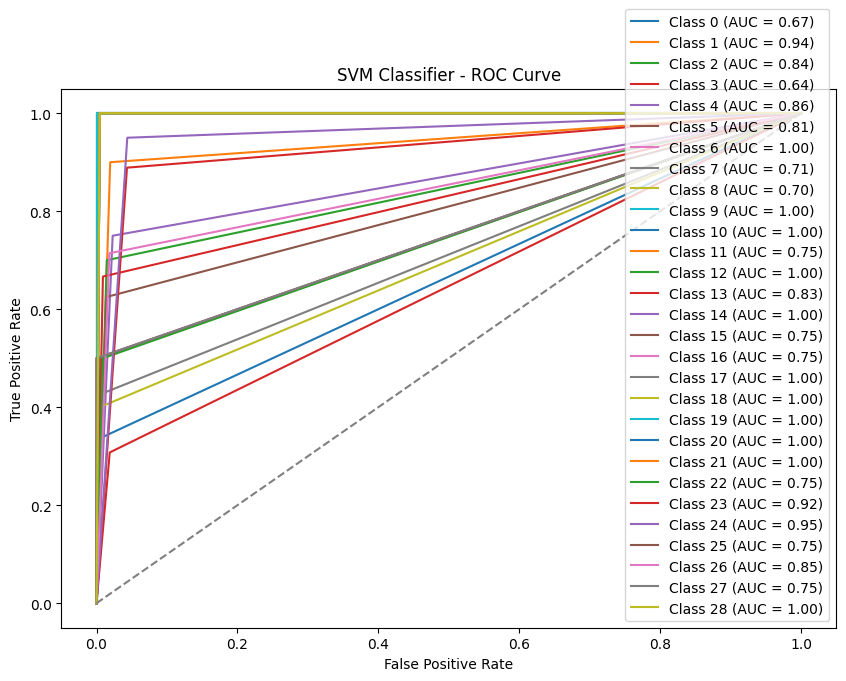

In [48]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the labels for multi-class ROC curve
y_test_bin = label_binarize(y_test_encoded, classes=np.unique(y_test_encoded))
y_pred_bin = label_binarize(y_pred_svm, classes=np.unique(y_test_encoded))

# Compute ROC curve and AUC for each class
fpr, tpr, roc_auc = {}, {}, {}
for i in range(len(np.unique(y_test_encoded))):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_bin[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for all classes
plt.figure(figsize=(10, 7))
for i in range(len(np.unique(y_test_encoded))):
    plt.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('SVM Classifier - ROC Curve')
plt.legend(loc="lower right")
plt.show()


In [49]:
from sklearn.metrics import classification_report
print("\nClassification Report:\n", classification_report(y_test_encoded, y_pred_svm))



Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.33      0.50         6
           1       0.82      0.90      0.86        20
           2       0.82      0.70      0.76        20
           3       0.50      0.31      0.38        13
           4       0.55      0.75      0.63         8
           5       0.77      0.62      0.69        16
           6       1.00      1.00      1.00         5
           7       0.60      0.43      0.50         7
           8       0.67      0.40      0.50         5
           9       0.80      1.00      0.89         4
          10       0.91      1.00      0.95        10
          11       0.67      0.50      0.57         4
          12       1.00      1.00      1.00         2
          13       0.67      0.67      0.67         6
          14       1.00      1.00      1.00         2
          15       0.67      0.50      0.57         4
          16       1.00      0.50      0.67        10
  

In [50]:
!pip install nltk
import nltk

nltk.download('punkt') # Download the Punkt Tokenizer Models
nltk.download('punkt_tab') # Download the Punkt Tokenizer Models

# 1. Define the new text (e.g., a word or sentence)
new_text = "Tiknoolajiyada iyo horumarka caafimaadka"

# 2. Preprocess the input text
def preprocess_text(text):
    # Tokenize and remove stop words (use the same stop words as before)
    from nltk.tokenize import word_tokenize # Import word_tokenize
    words = word_tokenize(text.lower())
    filtered_words = [word for word in words if word not in somali_stop_words]
    return " ".join(filtered_words)

processed_text = preprocess_text(new_text)

# ... (rest of your code)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt_tab.zip.


In [51]:
from sklearn.svm import SVC

# Train the SVM model (if not already trained)
svm_model = SVC(kernel='linear')  # Using linear kernel for example
svm_model.fit(X_train_tfidf, y_train_encoded)

SVC(kernel='linear')

In [61]:
from sklearn.svm import SVC
import joblib

# Train the SVM model
svm_model = SVC(kernel='linear')  # Using linear kernel for example
svm_model.fit(X_train_tfidf, y_train_encoded)

# Save the model to a file
joblib.dump(svm_model, "svm_model.pkl")

print("✅ Model trained and saved as 'SVM_model.pkl'")


✅ Model trained and saved as 'SVM_model.pkl'


In [62]:
from sklearn.svm import SVC
import joblib
import h5py
import io

# Train the SVM model
svm_model = SVC(kernel='linear')
svm_model.fit(X_train_tfidf, y_train_encoded)

# Serialize model into memory buffer using joblib
buffer = io.BytesIO()
joblib.dump(svm_model, buffer)
buffer.seek(0)

# Save buffer contents into an .h5 file
with h5py.File("svm_model.h5", "w") as f:
    f.create_dataset("svm_model", data=np.void(buffer.read()))

print(" Model saved as 'SVM_model.h5'")


 Model saved as 'SVM_model.h5'


In [56]:
# 1. Define the new text (e.g., a word or sentence)
new_text = " waxaa rabaa inaa barto VR(virtual Realty) sida uu wax ugu badali karo waxbarasho ?"

# 2. Preprocess the input text
def preprocess_text(text):
    # Tokenize and remove stop words (use the same stop words as before)
    #words = word_tokenize(text.lower())
    filtered_words = [word for word in words if word not in somali_stop_words]
    return " ".join(filtered_words)

processed_text = preprocess_text(new_text)

# 3. Transform the processed text using the TF-IDF vectorizer (same one used for training)
X_new = tfidf_vectorizer.transform([processed_text])

# 4. Predict the category using the trained SVM model
predicted_label = svm_model.predict(X_new)

# 5. Convert the predicted label back to the category name
predicted_category = label_encoder.inverse_transform(predicted_label)

print(f"Predicted category: {predicted_category[0]}")

Predicted category: cagliga macmalka


In [58]:
import tkinter as tk
from tkinter import messagebox

# Function to preprocess, transform, and predict
def predict_category():
    new_text = entry.get()
    if not new_text.strip():
        messagebox.showwarning("Input Error", "Please enter some text!")
        return
    
    # Preprocess text
    filtered_words = [word for word in new_text.lower().split() if word not in somali_stop_words]
    processed_text = " ".join(filtered_words)
    
    # Transform and predict
    X_new = tfidf_vectorizer.transform([processed_text])
    predicted_label = svm_model.predict(X_new)
    predicted_category = label_encoder.inverse_transform(predicted_label)
    
    # Show result
    messagebox.showinfo("Prediction Result", f"Predicted category: {predicted_category[0]}")

# Create Tkinter window
root = tk.Tk()
root.title("SVM Text Classifier")

# Input label and entry
tk.Label(root, text="Enter text:").pack(pady=5)
entry = tk.Entry(root, width=80)
entry.pack(pady=5)

# Predict button
tk.Button(root, text="Predict Category", command=predict_category).pack(pady=10)

# Run the GUI
root.mainloop()


In [59]:
import tkinter as tk
from tkinter import scrolledtext

# Function to preprocess, transform, and predict
def predict_category():
    new_text = text_input.get("1.0", tk.END).strip()
    if not new_text:
        result_label.config(text="⚠️ Please enter some text!", fg="red")
        return
    
    # Preprocess text
    filtered_words = [word for word in new_text.lower().split() if word not in somali_stop_words]
    processed_text = " ".join(filtered_words)
    
    # Transform and predict
    X_new = tfidf_vectorizer.transform([processed_text])
    predicted_label = svm_model.predict(X_new)
    predicted_category = label_encoder.inverse_transform(predicted_label)
    
    # Show result
    result_label.config(text=f"Predicted Category: {predicted_category[0]}", fg="green")

# Create main window
root = tk.Tk()
root.title("Advanced SVM Text Classifier")
root.geometry("700x400")
root.resizable(False, False)

# Title label
tk.Label(root, text="SVM Text Classifier", font=("Helvetica", 18, "bold")).pack(pady=10)

# Frame for input
input_frame = tk.Frame(root)
input_frame.pack(pady=10)

tk.Label(input_frame, text="Enter text:", font=("Helvetica", 12)).pack(anchor="w")
text_input = scrolledtext.ScrolledText(input_frame, width=80, height=6, wrap=tk.WORD)
text_input.pack()

# Predict button
predict_btn = tk.Button(root, text="Predict Category", font=("Helvetica", 12, "bold"),
                        bg="#4CAF50", fg="white", padx=10, pady=5, command=predict_category)
predict_btn.pack(pady=15)

# Result display
result_label = tk.Label(root, text="", font=("Helvetica", 14))
result_label.pack(pady=10)

# Run the GUI
root.mainloop()


In [63]:
import tkinter as tk
from tkinter import scrolledtext
from tkinter import ttk

# Prediction function
def predict_category(event=None):
    new_text = text_input.get("1.0", tk.END).strip()
    if not new_text:
        result_label.config(text="⚠️ Please enter some text!", fg="red")
        return

    # Preprocess text
    filtered_words = [word for word in new_text.lower().split() if word not in somali_stop_words]
    processed_text = " ".join(filtered_words)

    # Transform and predict
    X_new = tfidf_vectorizer.transform([processed_text])
    predicted_label = svm_model.predict(X_new)
    predicted_category = label_encoder.inverse_transform(predicted_label)

    # Update result
    result_label.config(text=f"Predicted Category: {predicted_category[0]}", fg="green")
    
    # Add to history
    history_list.insert(0, f"Text: {new_text} --> Prediction: {predicted_category[0]}")
    if history_list.size() > 10:
        history_list.delete(10)

# Clear input and output
def clear_all():
    text_input.delete("1.0", tk.END)
    result_label.config(text="")
    history_list.delete(0, tk.END)

# Main window
root = tk.Tk()
root.title("Advanced SVM Text Classifier")
root.geometry("800x600")
root.resizable(False, False)

# Title
title_label = tk.Label(root, text="Advanced SVM Text Classifier", font=("Helvetica", 20, "bold"), fg="#2E4053")
title_label.pack(pady=10)

# Input Frame
input_frame = tk.LabelFrame(root, text="Enter Text", font=("Helvetica", 12, "bold"), padx=10, pady=10)
input_frame.pack(padx=20, pady=10, fill="x")

text_input = scrolledtext.ScrolledText(input_frame, width=90, height=6, wrap=tk.WORD, font=("Helvetica", 12))
text_input.pack(padx=5, pady=5)
text_input.bind("<KeyRelease>", predict_category)  # Real-time prediction

# Buttons Frame
btn_frame = tk.Frame(root)
btn_frame.pack(pady=10)

predict_btn = tk.Button(btn_frame, text="Predict", font=("Helvetica", 12, "bold"), bg="#4CAF50", fg="white", padx=10, pady=5, command=predict_category)
predict_btn.grid(row=0, column=0, padx=10)

clear_btn = tk.Button(btn_frame, text="Clear", font=("Helvetica", 12, "bold"), bg="#E74C3C", fg="white", padx=10, pady=5, command=clear_all)
clear_btn.grid(row=0, column=1, padx=10)

# Result Frame
result_frame = tk.LabelFrame(root, text="Prediction Result", font=("Helvetica", 12, "bold"), padx=10, pady=10)
result_frame.pack(padx=20, pady=10, fill="x")

result_label = tk.Label(result_frame, text="", font=("Helvetica", 14), fg="green")
result_label.pack()

# History Frame
history_frame = tk.LabelFrame(root, text="Prediction History (Last 10)", font=("Helvetica", 12, "bold"), padx=10, pady=10)
history_frame.pack(padx=20, pady=10, fill="both", expand=True)

history_list = tk.Listbox(history_frame, font=("Helvetica", 12))
history_list.pack(fill="both", expand=True, padx=5, pady=5)

# Run GUI
root.mainloop()


In [ ]:
import tkinter as tk
from tkinter import scrolledtext

# Prediction function
def predict_category(event=None):
    new_text = text_input.get("1.0", tk.END).strip()
    if not new_text:
        result_label.config(text="⚠️ Please enter some text!", fg="red")
        return

    # Preprocess text
    filtered_words = [word for word in new_text.lower().split() if word not in somali_stop_words]
    processed_text = " ".join(filtered_words)

    # Transform and predict
    X_new = tfidf_vectorizer.transform([processed_text])
    predicted_label = svm_model.predict(X_new)
    predicted_category = label_encoder.inverse_transform(predicted_label)

    # Update result
    result_label.config(text=f"Predicted Category: {predicted_category[0]}", fg="white")

# Clear input and output
def clear_all():
    text_input.delete("1.0", tk.END)
    result_label.config(text="")

# Main window
root = tk.Tk()
root.title("Advanced SVM Text Classifier")
root.geometry("800x400")
root.resizable(False, False)
root.configure(bg="#1E90FF")  # Blue background

# Title
title_label = tk.Label(root, text="Advanced SVM Text Classifier", font=("Helvetica", 20, "bold"), fg="white", bg="#1E90FF")
title_label.pack(pady=10)

# Input Frame
input_frame = tk.LabelFrame(root, text="Enter Text", font=("Helvetica", 12, "bold"), padx=10, pady=10, bg="#1E90FF", fg="white")
input_frame.pack(padx=20, pady=10, fill="x")

text_input = scrolledtext.ScrolledText(input_frame, width=90, height=6, wrap=tk.WORD, font=("Helvetica", 12))
text_input.pack(padx=5, pady=5)
text_input.bind("<KeyRelease>", predict_category)  # Real-time prediction

# Buttons Frame
btn_frame = tk.Frame(root, bg="#1E90FF")
btn_frame.pack(pady=10)

predict_btn = tk.Button(btn_frame, text="Predict", font=("Helvetica", 12, "bold"), bg="#4CAF50", fg="white", padx=10, pady=5, command=predict_category)
predict_btn.grid(row=0, column=0, padx=10)

clear_btn = tk.Button(btn_frame, text="Clear", font=("Helvetica", 12, "bold"), bg="#E74C3C", fg="white", padx=10, pady=5, command=clear_all)
clear_btn.grid(row=0, column=1, padx=10)

# Result Frame
result_frame = tk.LabelFrame(root, text="Prediction Result", font=("Helvetica", 12, "bold"), padx=10, pady=10, bg="#1E90FF", fg="white")
result_frame.pack(padx=20, pady=10, fill="x")

result_label = tk.Label(result_frame, text="", font=("Helvetica", 14), fg="white", bg="#1E90FF")
result_label.pack()

# Run GUI
root.mainloop()


In [60]:
print (X_test)

1002    sidee baa loo xallin karaa arrimahan caafimaad...
2473           maxey faaidada leeyihin robot yada beeraha
2445    xageey bilaabate tiknolojiyada qorsheynta gaad...
628     maxay yihiin isticmaalka waaweyn ee ai ee loog...
11      caqabad managu yeelan kartaa aaladaha tiknoola...
                              ...                        
3901    keebaa u wax tar badan gaancsiga suuq geynta c...
2510    hadda marka loo eego waxaas tiknoolajiyaddu mi...
1007    sidee bey u kordhin kartaa vr xirfadaha ardayd...
3959                                    maxay private key
206     28 door noocee ayey laheyd tiknoolojiyada covi...
Name: Processed_Text, Length: 226, dtype: object
